![Sfm banner](https://i.imgur.com/C7rLCRk.png)

# Reconstrucción 3D - Structure From Motion!

>[Reconstrucción 3D - Structure From Motion!](#scrollTo=QP8lCT0INwFd)

>>>[Cargar imágenes](#scrollTo=Cdw6YehXNtZ3)

>>>[Calibrar imágenes](#scrollTo=nTGcmzWb8awi&line=2&uniqifier=1)

>>>[Cargar los parámetros de la cámara:](#scrollTo=YeJhDSgaNtaB)

>>>[Procesamiento de las imagenes](#scrollTo=bvIwauNpNtaF)

>[Funciones para structure from motion:](#scrollTo=6UYrOTe0Sbc-)

>>[Encontrar puntos clave!](#scrollTo=lvplqF24NtaH)

>>[Mostrar geometria epipolar](#scrollTo=WxSEbeaMNtaJ)

>>[Obtener nube de puntos 3d](#scrollTo=QFfU_lKMNtaM)

>>[Bundle adjustment](#scrollTo=4-8zTVaXNtaQ)

>[Reconstrucción!](#scrollTo=XFXklb9CNtaT)

>>>[Redimensionar imágenes](#scrollTo=K-H9IQRYe8d1)

>>>[Extraer puntos clave](#scrollTo=Lpr7B7YzNtaV)

>>>[Obtener matriz fundamental a partir de los puntos emparejados](#scrollTo=2yEYhYZ_YCvO)

>>>[Construir manualmente el mapa de dispariedad para comprobar si los puntos son buenos](#scrollTo=aXA-vx0HWqRT)

>>>[Obtener matriz escencial](#scrollTo=z0keBRalWzqN)

>>>[Ahora con más puntos, se hace la triangulación y se construye la nube de puntos](#scrollTo=JnpogfQvW5B6)

>>>[Bundle adjustemnt a la nube de puntos obtenida a partir de dos vistas](#scrollTo=GzqKqbXvXC5G)

>>>[Agregamos el resto de las imágenes](#scrollTo=D8sJKROBXK7W)

>>>[Dilatar y erosión de puntos: juntar puntos cercanos](#scrollTo=jwErE-H7Ntbl)

>[Probar con otras imágenes!](#scrollTo=j6foM8eOhTcX)



In [1]:
!pip install open3d

  Using cached jedi-0.19.1-py2.py3-none-any.whl.metadata (22 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 399.7/399.7 MB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.5/7.5 MB 50.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.8/139.8 kB 10.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 16.7 MB/s eta 0:00:00
Using cached jedi-0.19.1-py2.py3-none-any.whl (1.6 MB)
  Attempting uninstall: widgetsnbextension
    Found existing installation: widgetsnbextension 3.6.8
    Uninstalling widgetsnbextension-3.6.8:
      Successfully uninstalled widgetsnbextension-3.6.8
  Attempting uninstall: ipywidgets
    Found existing installation: ipywidgets 7.7.1
    Uninstalling ipywidgets-7.7.1:
      Successfully uninstalled ipywidgets-7.7.1


In [2]:
import matplotlib.pyplot as plt
from matplotlib.patches import Circle
%matplotlib inline
from mpl_toolkits.mplot3d import Axes3D

import cv2
import numpy as np
import open3d as o3d
import plotly.graph_objects as go
import os

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


###**Cargar imágenes**
Las imágenes deben estar preferiblemente en el orden en que fueron tomadas rodeando el objeto, se necesitan al menos dos imágenes, y para que sea de multiples vistas deben ser más de dos

In [ ]:
# Specify the directory containing the images
folder = "/content/drive/MyDrive/computer vision"
image_folder = folder + "/greek"

# List all files in the directory
image_files = sorted([f for f in os.listdir(image_folder) if os.path.isfile(os.path.join(image_folder, f))])

# Initialize an empty list to store the images
images = []
images_gray = []

# Load each image and store it in the list
for file_name in image_files:
    img_path = os.path.join(image_folder, file_name)
    img = cv2.imread(img_path)
    if img is not None:  # Check if the image was loaded successfully
        # algunas imagenes hay que rotarlas
        rotated_img = cv2.rotate(img, cv2.ROTATE_90_COUNTERCLOCKWISE)
        rotated_img = img
        images_gray.append(cv2.cvtColor(rotated_img, cv2.COLOR_BGR2GRAY))
        images.append(cv2.cvtColor(rotated_img, cv2.COLOR_BGR2RGB))
    else:
        print(f"Warning: Could not load image {img_path}")

# Determine the number of images
num_images = len(images)
print(f"Loaded {num_images} images.")

Loaded 6 images.


In [ ]:
print(images[0].shape)

(4608, 3456, 3)


Imprimir las imágenes

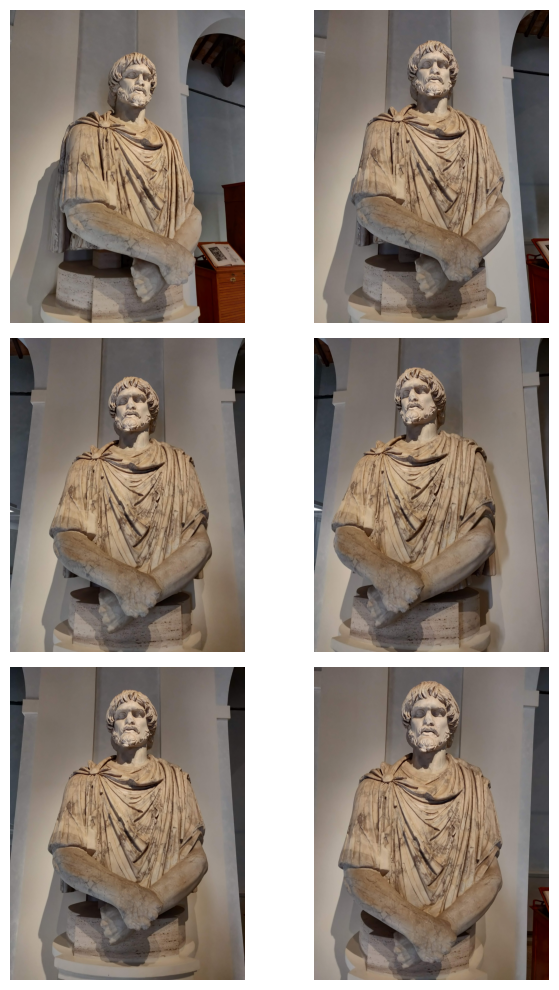

In [ ]:
# Determine the grid size for plotting
cols = 2  # Number of columns in the grid
rows = (num_images + cols - 1) // cols  # Calculate the number of rows needed

# Create a figure to display the images
fig, axes = plt.subplots(rows, cols, figsize=(7, 10))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Plot each image
for ax, img in zip(axes, images):
    # Convert the image from BGR to RGB format
    ax.imshow(img)
    ax.axis('off')  # Hide the axis

# Hide any remaining empty subplots
for ax in axes[num_images:]:
    ax.axis('off')

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

### **Calibración de la cámara**
Es necesario calibrar la cámara con la que se tomaron las fotos, pues pueden introducirse distorsiones a nuestras imágenes y afectar el resultado. La calibración nos da los parámetros intrínsecos de la cámara necesarios para transformar las fotos y mejorar la precisión.

In [ ]:
#@title función para calibrar imagenes con patrón ajedrez
def calibrate(resized_images, output_folder):
    import cv2
    import numpy as np

    #DIMENSIONES DEL TABLERO
    #SE CUENTA DESDE EL 0
    CHECKERBOARD = (6, 8)


    # stop the iteration when specified
    # accuracy, epsilon, is reached or
    # specified number of iterations are completed.
    criteria = (cv2.TERM_CRITERIA_EPS +
                cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)


    # Vector for 3D points
    threedpoints = []

    # Vector for 2D points
    twodpoints = []


    #  3D points real world coordinates
    objectp3d = np.zeros((1, CHECKERBOARD[0]
                        * CHECKERBOARD[1],
                        3), np.float32)
    objectp3d[0, :, :2] = np.mgrid[0:CHECKERBOARD[0],
                                0:CHECKERBOARD[1]].T.reshape(-1, 2)
    prev_img_shape = None


    #se carga cada imagen individualmente
    for i, image in enumerate(resized_images):
        grayColor = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

        # Find the chess board corners
        # If desired number of corners are
        # found in the image then ret = true
        ret, corners = cv2.findChessboardCorners(
                        grayColor, CHECKERBOARD,
                        cv2.CALIB_CB_ADAPTIVE_THRESH
                        + cv2.CALIB_CB_FAST_CHECK +
                        cv2.CALIB_CB_NORMALIZE_IMAGE)

        # If desired number of corners can be detected then,
        # refine the pixel coordinates and display
        # them on the images of checker board
        if ret == True:
            threedpoints.append(objectp3d)

            # Refining pixel coordinates
            # for given 2d points.
            corners2 = cv2.cornerSubPix(
                grayColor, corners, (11, 11), (-1, -1), criteria)

            twodpoints.append(corners2)

            # Draw and display the corners
            image = cv2.drawChessboardCorners(image,
                                            CHECKERBOARD,
                                            corners2, ret)
            # Save image with corners
            cv2.imwrite(os.path.join(output_folder, f"calibrated_image_{i}.jpg"), image)

    h, w = image.shape[:2]
    # Perform camera calibration by
    # passing the value of above found out 3D points (threedpoints)
    # and its corresponding pixel coordinates of the
    # detected corners (twodpoints)
    ret, matrix, distortion, r_vecs, t_vecs = cv2.calibrateCamera(
        threedpoints, twodpoints, grayColor.shape[::-1], None, None)


    return matrix, distortion, r_vecs, t_vecs

In [ ]:
import os
import glob
path = '/content/drive/MyDrive/busto_julio/calibrar/fotos'

#buscar todas las imágenes con extensión .jpg en el directorio
images_path = os.path.join(path, '*.jpg')
images = glob.glob(images_path)

scale_factor = 0.5 #si no se quieren reducir la resolución de las imgs, se cambia el valor a 1

resized_images = []

for filename in images:

    image = cv2.imread(filename)

    #esto solo es para reducir las dimensiones de las imgs de calibrar a la mitad
    new_height = int(image.shape[0] * scale_factor)
    new_width = int(image.shape[1] * scale_factor)

    resized_image = cv2.resize(image, (new_width, new_height))

    resized_images.append(resized_image)

In [ ]:
#se crea previamente una carpeta en la que quiera guardar los resultados de la calibración
folder='/content/drive/MyDrive/busto_julio/calibrar/resultados'

matrix, distortion, r_vecs, t_vecs=calibrate(resized_images,folder)
print(" Camera matrix:")
print(matrix)

print("\n Distortion coefficient:")
print(distortion)

print("\n Rotation Vectors:")
print(r_vecs)

print("\n Translation Vectors:")
print(t_vecs)

 Camera matrix:
[[1.05911435e+03 0.00000000e+00 6.05541949e+02]
 [0.00000000e+00 1.07081186e+03 8.33122366e+02]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]

 Distortion coefficient:
[[ 0.08059014  0.88700663 -0.0195772   0.02396288 -1.52412086]]

 Rotation Vectors:
(array([[-0.2748138 ],
       [-0.27949929],
       [ 1.5990894 ]]), array([[-0.07793077],
       [-0.06557186],
       [ 1.5918187 ]]), array([[-0.52146534],
       [-0.46765199],
       [ 1.50688396]]), array([[-0.14514888],
       [ 0.19001244],
       [-1.55563203]]), array([[-0.41699656],
       [-0.3759601 ],
       [ 1.54908598]]), array([[-0.14514888],
       [ 0.19001244],
       [-1.55563203]]), array([[-0.44115466],
       [ 0.62212904],
       [-1.44563586]]), array([[-0.27984524],
       [ 0.38115519],
       [-1.47876033]]), array([[-0.27984524],
       [ 0.38115519],
       [-1.47876033]]), array([[-0.61496887],
       [ 0.73242916],
       [-1.44303379]]), array([[ 0.0647362 ],
       [-0.06931127],
    

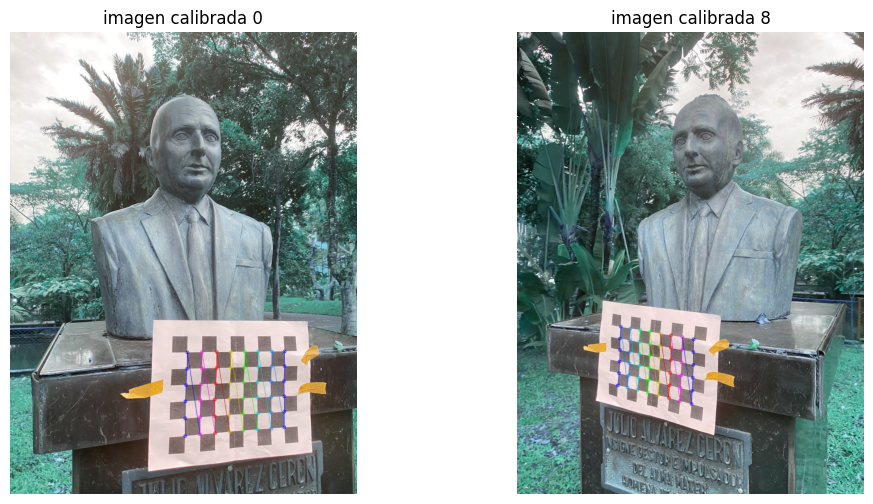

In [ ]:
#@title visualizar imagenes calibradas resultantes

i=0 #@param {type: "integer"}
j=8 #@param {type: "integer"}

img1 = cv2.imread(os.path.join(folder, f'calibrated_image_{i}.jpg'))
img2 = cv2.imread(os.path.join(folder, f'calibrated_image_{j}.jpg'))


plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(img1)
plt.title(f'imagen calibrada {i}')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(img2)
plt.title(f'imagen calibrada {j}')
plt.axis('off')

plt.show()

### **Cargar los parámetros de la cámara**:
 Al calibrar la camara obtenemos los parametros físicos de esta, representados por la matriz K


<img src="https://user-images.githubusercontent.com/55543262/111658979-cdb24500-8847-11eb-8c97-88b31aac56c9.png" alt="alt text"/>

In [ ]:
#greek
K = 1.0e+03* np.array([[3.6090 ,0,2.3160],[0,3.5870,1.7493],[0,0,0.0010]])
dist = np.array([0.0224,-0.3622, 0,0])
dist = np.array([0.0, 0.0, 0.0, 0.0 ])


In [ ]:
# vertical 2
K = 1.0e+03* np.array([[3.2794   ,      0   ,  1.5540],[ 0   , 3.2578  ,  2.0685],[0,0,0.0010]])
dist = np.array([0.2438, 0.3445, 0,0])

In [ ]:
# horizontal 2
K = 1.0e+03* np.array([[3.2137  ,       0   , 2.0701],[ 0  ,  3.2005 ,   1.4973],[0,0,0.0010]])
dist = np.array([0.1369, 0.4725, 0,0])

In [ ]:
#buddha1
K =  np.array([[3126.22235, 0, 2074.44839],[0 ,3115.76447, 1511.57782],[0, 0 ,1]])
dist = np.array([0.0, 0.0, 0.0, 0.0 ])

In [ ]:
# ramiro
K =  np.array([[3079.0, 0.0000, 1505.9],[0.0000, 3065.7, 1982.1],[0.0000 ,0.0000 ,1.0000]])
dist = np.array([0.0, 0.0, 0.0, 0.0 ])

In [ ]:
# fuente
K = np.array([[2759.48, 0, 1520.69],[0, 2764.16, 1006.81 ], [0.0, 0.0, 1.0 ]])
dist = np.array([0.0, 0.0, 0.0, 0.0 ])


In [ ]:
#busto julio rector
K=np.array([[1.05911436e+03, 0.00000000e+00, 6.05541949e+02],
       [0.00000000e+00, 1.07081186e+03, 8.33122366e+02],
       [0.00000000e+00, 0.00000000e+00, 1.00000000e+00]])
dist=np.array([[ 0.08059014,  0.88700663, -0.0195772 ,  0.02396288, -1.52412086]])

### Procesamiento de las imagenes

**Eliminar distorsión de la cámara:** al obtener los parametros de la cámara, tambien podemos obetener un vector de distorsión, este depende de los parametros físicos de la cámara con la cual se tomó la foto.  Usando una función de opencv se puede remover la distorsión de la cámara

In [4]:
def undistort_image(img,K,dist):
    h, w = img.shape[:2]
    newcameramtx, roi = cv2.getOptimalNewCameraMatrix(K,dist, (w,h), 1, (w,h))

    dst = cv2.undistort(img, K, dist, None, newcameramtx)
    # crop the image
    x, y, w, h = roi
    dst = dst[y:y+h, x:x+w]
    #print(f"Tamaño original {img.shape}")
    #print(f"Tamaño sin distorsion {dst.shape}")
    return dst

**Redimensionar imágen:** enocntrar los keypoints en imágenes grandes es más demorado, por lo que se puede redimensionar la imagen sin afectar el resultado. UAnque si se va a redimensioanr la imagen también se deben modificar los valores de K, según el factor de escala de la imágen!


In [5]:
# Get the original dimensions of the image
def resize_image(image,scale_factor):
    height, width = image.shape[:2]

    # Calculate the new dimensions
    new_width = int(width / scale_factor)
    new_height = int(height / scale_factor)
    # Resize the image while preserving the aspect ratio
    resized_image = cv2.resize(image, (new_width, new_height), interpolation=cv2.INTER_AREA)

    print("New shape: ", resized_image.shape)
    # Display the resized image
    #plt.imshow(resized_image)
    #plt.show()
    return resized_image

# Funciones para structure from motion:

Ahora explicaremos cada función utilizada en el proceso de structure from motion, en la siguiente sección se aplicarán estas funciones para obtener la reconstrucción de un objeto!

Primero es importante entender que para poder reconstruir un objeto 3d a partir de imágenes nos basamos en la geometría epipolar.

**La geometría epipolar relaciona la posición de la camara que toma cada foto con la posición de esos puntos en un mundo 3D.**

Si tenemos dos fotografias de un objeto, tenemos dos posiciones distintas desde donde se toma la foto. Podemos obtener una matriz que describa la posición de una camara respecto a otra al comparar la posición de ciertos puntos en una foto respecto a otra. Estos puntos que vamos a comparar se llaman los **keypoints**. La primera parte del proceso de reconstrucción consiste en encontrar qué posición en cada imagen tienen esos keypoints.

La segunda parte consiste en computar las matrices que describan las posiciones de las camaras

Teniendo las posiciones de las camaras podemos computar que posición en 3D le corresponde a cada punto en 2D!



## Encontrar puntos clave!
<img src="https://media.springernature.com/lw685/springer-static/image/chp%3A10.1007%2F978-3-030-03000-1_5/MediaObjects/466590_1_En_5_Fig3_HTML.png" width="auto" height="300px" alt="alt text"/>

Primero es importante encontrar puntos clave dentro de la imagen que nos sirvan para emparejarlos, etsos puntos deben ser invariantes de escala y rotación, es decir que puedan ser detectados a diferentes tamaños y orientaciones de la imágen. Hay muchos algoritmos que pueden realizar esta tarea como **SIFT (Scale-Invariant Feature Transform)**, también esta ORB (Oriented FAST and Rotated BRIEF) y SURF (Speeded Up Robust Features)

Estos algoritmos detectan los puntos clave mediante un enfoque común: buscan características distintivas en la imagen que sean estables frente a cambios de escala y rotación.

* Localización: Encuentran regiones en la imagen que son ricas en información, como esquinas o bordes, utilizando métodos que analizan cambios en la intensidad de los píxeles.

* Invariancia a Escala: Utilizan técnicas que les permiten detectar estas características en múltiples escalas, garantizando que sean reconocibles sin importar el tamaño de la imagen.

* Invariancia a Rotación: Asignan una orientación a cada punto clave basándose en la dirección de los gradientes locales, lo que les permite ser consistentes independientemente de la rotación de la imagen.

* Descripción: Generan descriptores que resumen la información alrededor de cada punto clave, capturando las características distintivas que pueden ser utilizadas para emparejar puntos en diferentes imágenes.


In [6]:
"""
  Detecta puntos clave y calcula sus descriptores en una imagen dada utilizando el algoritmo SIFT.

  Parámetros:
  - img: Imagen de entrada (en formato BGR).
  - roi: Región de Interés (ROI) especificada como una tupla (x, y, w, h) donde
          (x, y) es la esquina superior izquierda del rectángulo, y (w, h) son
          el ancho y la altura del rectángulo. Si es None, se utiliza toda la imagen.
          (esto es porque a veces los bordes pueden resultar en muchos emparejamientos pero no son buenos matches)

  Retorna:
  - kp1: Lista de puntos clave detectados.
  - desc1: Descriptores correspondientes a los puntos clave detectados.
"""
def get_keypoints(img, roi=None):
    # Convert image to grayscale
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # If an ROI is provided, apply it
    if roi is not None:
        x, y, w, h = roi
        img_gray = img_gray[y:y+h, x:x+w]

    # Create SIFT feature detector
    feature_detector = cv2.xfeatures2d.SIFT_create()

    # Detect and compute keypoints and descriptors in the ROI
    kp1, desc1 = feature_detector.detectAndCompute(img_gray, None)

    # If an ROI was applied, we need to adjust the keypoints' coordinates
    if roi is not None:
        for kp in kp1:
            kp.pt = (kp.pt[0] + x, kp.pt[1] + y)

    print(f"Keypoints with SIFT: {len(kp1)}")
    return kp1, desc1

In [7]:
"""
    Encuentra los mejores emparejamientos de puntos clave entre dos conjuntos de puntos clave y sus descriptores.

    Parámetros:
    - kp1: Lista de puntos clave de la primera imagen.
    - desc1: Descriptores correspondientes a los puntos clave de la primera imagen.
    - kp2: Lista de puntos clave de la segunda imagen.
    - desc2: Descriptores correspondientes a los puntos clave de la segunda imagen.
    - method: Método a utilizar para el emparejamiento.
    - distance: Factor de distancia utilizado para el test de distancia (default es 0.70).

    Retorna:
    - kp1_r: Puntos clave de la primera imagen que fueron emparejados.
    - kp2_r: Puntos clave de la segunda imagen que fueron emparejados.
    - desc1_r: Descriptores correspondientes a los puntos clave emparejados de la primera imagen.
    - desc2_r: Descriptores correspondientes a los puntos clave emparejados de la segunda imagen.
    - good_matches: Lista de emparejamientos válidos.
  """

def find_best_matches(kp1, desc1, kp2, desc2, method, distance = 0.70):
    # Brute Force matcher with L2 distance como default
    if method == "ORB": # cuando se detectan features con orb es mejor usar BF
        matcher = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=False)

    elif method == "FLANN":
        matcher = cv2.DescriptorMatcher_create(cv2.DescriptorMatcher_FLANNBASED)
    else:
        matcher = cv2.BFMatcher(cv2.NORM_L2, crossCheck=False)

    matches = matcher.knnMatch(desc1, desc2, k=2)

    # Ratio test
    good_matches = []
    for m, n in matches:
        if m.distance < distance * n.distance:
            good_matches.append(m)

    print(f"Matched points {len(matches)}\nGood matches {len(good_matches)}")

    # Retrieve indices of the good matches
    img1idx = np.array([m.queryIdx for m in good_matches])
    img2idx = np.array([m.trainIdx for m in good_matches])

    # Filtering out the keypoints that were NOT matched
    kp1_ = np.array(kp1)[img1idx]
    kp2_ = np.array(kp2)[img2idx]

    # Retrieve the image coordinates of matched keypoints
    matchedPoints1 = np.array([kp.pt for kp in kp1_])
    matchedPoints2 = np.array([kp.pt for kp in kp2_])

    kp1_r = matchedPoints1
    kp2_r = matchedPoints2

    # Filter descriptors using the matches mask
    desc1_r = desc1[img1idx]
    desc2_r = desc2[img2idx]

    return kp1_r, kp2_r, desc1_r, desc2_r, good_matches, img1idx, img2idx


"""
  Utiliza el algoritmo RANSAC para estimar el mejor conjunto de características emparejadas entre
  dos conjuntos de puntos clave, filtrando los emparejamientos incorrectos (outliers).

  Parámetros:
  - matchedPoints1: Puntos clave emparejados de la primera imagen.
  - desc1: Descriptores correspondientes a los puntos clave emparejados de la primera imagen.
  - matchedPoints2: Puntos clave emparejados de la segunda imagen.
  - desc2: Descriptores correspondientes a los puntos clave emparejados de la segunda imagen.
  - ransacReprojThreshold: Umbral de reproyección utilizado para determinar si un punto es un outlier
                          (por defecto es 1 pixel).

  Retorna:
  - kp1_r: Puntos clave de la primera imagen que han sido confirmados como válidos.
  - kp2_r: Puntos clave de la segunda imagen que han sido confirmados como válidos.
  - desc1_r: Descriptores correspondientes a los puntos clave válidos de la primera imagen.
  - desc2_r: Descriptores correspondientes a los puntos clave válidos de la segunda imagen.
  - matchesMask: Lista de máscaras que indica qué emparejamientos fueron considerados válidos.
"""
def ransac(matchedPoints1, desc1,  matchedPoints2, desc2, ransacReprojThreshold = 1):
     # Use RANSAC to estimate the best set of matched features
    M, mask = cv2.findHomography(matchedPoints1, matchedPoints2, cv2.RANSAC, ransacReprojThreshold, confidence=0.99)
    matchesMask = mask.ravel().tolist()

    kp1_r = matchedPoints1[mask.ravel() == 1]
    kp2_r = matchedPoints2[mask.ravel() == 1]

    # Filter descriptors using the matches mask
    desc1_r = desc1[mask.ravel() == 1]
    desc2_r = desc2[mask.ravel() == 1]

    print(f"RANSAC matches: pts1 {kp1_r.shape} and pts2 {kp2_r.shape}")
    return kp1_r, kp2_r, desc1_r, desc2_r, matchesMask



In [8]:
# funcion para imprimir matches
def print_matches(matchesMask, img1d,img2d,kp1,kp2,good_matches):
    draw_params = dict(matchColor = (0,255,0), # draw matches in green color
    singlePointColor = None,
    matchesMask = matchesMask, # draw only inliers
    flags = 2)

    img_matches = cv2.drawMatches(img1d,kp1,img2d,kp2,good_matches,None,**draw_params)

    plt.figure(figsize=(10, 5))
    plt.imshow(img_matches)
    plt.title("Emparejamientos encontrados con RANSAC")
    plt.show()

def print_fundamental_matches(img1d, img2d,pts1, pts2, mask ):
    h,w, _ = img1d.shape
    img_matches = np.concatenate((img1d, img2d), axis=1)  # Concatenate images side by side
    for i in range(len(pts1)):
        pt1 = tuple(map(int, pts1[i]))
        pt2 = tuple(map(int, pts2[i]))
        if mask[i]:
            cv2.line(img_matches, pt1, (pt2[0] + w, pt2[1]), (0, 255, 0), 1)  # Draw green line for inliers
        #else:
            #cv2.line(img_matches, pt1, (pt2[0] + w, pt2[1]), (0, 0, 255), 1)  # Draw red line for outliers

    plt.figure(figsize=(10, 5))
    plt.imshow(img_matches)
    plt.title("Emparejamientos inlier de matriz fundamental")
    plt.show()

def print_best_matches(img1d, img2d,pts1, pts2):
    h,w, _ = img1d.shape
    img_matches = np.concatenate((img1d, img2d), axis=1)  # Concatenate images side by side
    for i in range(len(pts1)):
        pt1 = tuple(map(int, pts1[i]))
        pt2 = tuple(map(int, pts2[i]))
        cv2.line(img_matches, pt1, (pt2[0] + w, pt2[1]), (0, 255, 0), 1)  # Draw green line for inliers
        #print(pt1)
        #else:
            #cv2.line(img_matches, pt1, (pt2[0] + w, pt2[1]), (0, 0, 255), 1)  # Draw red line for outliers

    plt.figure(figsize=(10, 5))
    plt.imshow(img_matches)
    plt.title("Emparejamientos")
    plt.show()

## Mostrar geometria epipolar

Calculando manualmente la geometria epipolar podemos darnos una idea si el emparejamiento de puntos fue bueno, (estas funciones nos las robamos de la sesión del semillero)

In [9]:
def plot_disparitymap(imgL,imgR,disparity_map):
    disparity_map[(disparity_map <= 0)] = 1

    plt.figure(figsize=(16,5))
    plt.subplot(1,3,1)
    plt.imshow(imgL, cmap='gray')
    plt.title("Image Left")

    plt.subplot(1,3,2)
    plt.imshow(imgR, cmap='gray')
    plt.title("Image Right")

    plt.subplot(1,3,3)
    plt.imshow(disparity_map, cmap='viridis')
    plt.colorbar()
    plt.title('Disparity map')

def show_images(img1, img2, title1, title2):
    print("Image sizes:", img1.shape, "and", img2.shape)
    plt.figure(figsize=(15,9))
    plt.subplot(1, 2, 1)
    plt.imshow(img1, cmap="gray")
    plt.title(title1)

    plt.subplot(1, 2, 2)
    plt.imshow(img2,cmap="gray")
    plt.title(title2)
    plt.show()

def drawlines(img1, img2, lines, pts1, pts2):
    imgLines = img1.copy()
    imgLines1 = img2.copy()
    r, c = imgLines.shape[:2]
    color = (255, 255, 255)


    for line, pt1, pt2 in zip(lines, pts1, pts2):
        x0, y0 = map(int, [0, -line[2] / line[1]])
        x1, y1 = map(int, [c, -(line[2] + line[0] * c) / line[1]])
        imgLines = cv2.line(imgLines, (x0, y0), (x1, y1), color, 1)

        pt1 = (int(pt1[0]), int(pt1[1]))
        pt2 = (int(pt2[0]), int(pt2[1]))
        imgLines = cv2.circle(imgLines, pt1, 5, color, -1)
        imgLines1 = cv2.circle(imgLines1, pt2, 5, color, -1)

    return imgLines


def draw_epilines_and_points(img1, lines, pts1):
    img_with_epilines = img1.copy()
    color = (255, 0, 0)

    for line, pt1 in zip(lines, pts1):
        x0, y0 = map(int, [0, -line[2] / line[1]])
        x1, y1 = map(int, [img1.shape[1], -(line[2] + line[0] * img1.shape[1]) / line[1]])
        img_with_epilines = cv2.line(img_with_epilines, (x0, y0), (x1, y1), color, 1)
        pt1 = (int(pt1[0]), int(pt1[1]))
        img_with_epilines = cv2.circle(img_with_epilines, pt1, 5, color, -1)
    return img_with_epilines

def add_epilines_to_rectified_images(imgLeft, imgRight, ptsLeft, ptsRight, h1, h2):
    ptsLeftRtf = cv2.perspectiveTransform(np.float32(ptsLeft).reshape(-1, 1, 2), h1).reshape(-1, 2)
    ptsRightRtf = cv2.perspectiveTransform(np.float32(ptsRight).reshape(-1, 1, 2), h2).reshape(-1, 2)

    linesLeftRtf = np.zeros((len(ptsLeftRtf), 3))
    linesRightRtf = np.zeros((len(ptsRightRtf), 3))
    linesLeftRtf[:, 1] = -1
    linesRightRtf[:, 1] = -1
    linesLeftRtf[:, 2] = ptsLeftRtf[:, 1]
    linesRightRtf[:, 2] = ptsRightRtf[:, 1]
    imgLeftWithEpilines = draw_epilines_and_points(imgLeft, linesLeftRtf, ptsLeftRtf)
    imgRightWithEpilines = draw_epilines_and_points(imgRight, linesRightRtf, ptsRightRtf)

    return imgLeftWithEpilines, imgRightWithEpilines, linesLeftRtf, linesRightRtf

def show_epipolar(pts1,pts2, img1,img2, F):
    ptsRight = pts2
    ptsLeft = pts1
    imgRight = img2
    imgLeft = img1

    linesLeft = cv2.computeCorrespondEpilines(ptsRight.reshape(-1, 1, 2), 2, F)
    linesLeft = linesLeft.reshape(-1, 3)
    img5 = drawlines(imgLeft, imgRight, linesLeft, ptsLeft, ptsRight)

    linesRight = cv2.computeCorrespondEpilines(ptsLeft.reshape(-1, 1, 2), 1, F)
    linesRight = linesRight.reshape(-1, 3)
    img3 = drawlines(imgRight, imgLeft, linesRight, ptsRight, ptsLeft)

    show_images(img5,img3, "Imagen Izquierda con Lineas Epipolares", "Imagen Derecha con Lineas Epipolares")

def show_disparity(pts1, pts2, img1,img2, F):
    # Calcular las homografías para la rectificación sin datos de calibración de cámara
    _, h1, h2 = cv2.stereoRectifyUncalibrated(np.float32(pts1), np.float32(pts2), F, img1.shape[:2])

    # Aplicar las homografías para rectificar las imágenes
    imgLeftRectified = cv2.warpPerspective(img1, h1, (img1.shape[1], img1.shape[0]))
    imgRightRectified = cv2.warpPerspective(img2, h2, (img2.shape[1], img2.shape[0]))
    show_images(imgLeftRectified,imgRightRectified, "Imagen Izquierda Rectificada", "Imagen Derecha Rectificada")

    stereo = cv2.StereoSGBM_create(numDisparities=32,blockSize=11)

    disparity_map = stereo.compute(imgLeftRectified, imgRightRectified)
    disparity_map[(disparity_map <= 0)] = 1

    plot_disparitymap(imgLeftRectified, imgRightRectified, disparity_map)


## Obtener nube de puntos 3d

A partir de los puntos clave emparejados, los parámetros intrínsecos de la cámara 𝐾, así como las matrices de rotación y translación de cada imagen, se realiza la triangulación utilizando una función de OpenCV. Antes de esto, se aplica una transformación a los puntos para eliminar su dependencia de los parámetros intrínsecos de la cámara. Para lograrlo, se convierte a coordenadas homogéneas, que es una forma diferente de representar coordenadas y que resulta conveniente para aplicar transformaciones lineales.

In [10]:
"""
  Calcula los puntos 3D a partir de las proyecciones 2D en dos imágenes,
  utilizando la matriz de intrínsecos de la cámara y las matrices de rotación
  y traslación de las cámaras.

  Parámetros:
  - pts1: Puntos 2D de la primera imagen (en coordenadas de píxeles).
  - pts2: Puntos 2D de la segunda imagen (en coordenadas de píxeles).
  - K: Matriz de parámetros intrínsecos de la cámara.
  - R1: Matriz de rotación de la primera cámara.
  - t1: Vector de traslación de la primera cámara.
  - R2: Matriz de rotación de la segunda cámara.
  - t2: Vector de traslación de la segunda cámara.

  Retorna:
  - pts3d: Puntos 3D calculados a partir de las proyecciones 2D.
"""
def get_3d_points(pts1,pts2, K, R1,t1,R2,t2):
    # Esta parte se supone que transforma los puntos para que no dependan de los
    # parametros intrinsecos de la camara

    # Convierte los puntos 2D a coordenadas homogéneas para las dos imágenes.
    img1ptsHom = cv2.convertPointsToHomogeneous(pts1)[:, 0, :]
    img2ptsHom = cv2.convertPointsToHomogeneous(pts2)[:, 0, :]

    # Normaliza los puntos 2D eliminando la dependencia de los parámetros intrínsecos de la cámara.
    img1ptsNorm = (np.linalg.inv(K).dot(img1ptsHom.T)).T
    img2ptsNorm = (np.linalg.inv(K).dot(img2ptsHom.T)).T

    # Convierte los puntos normalizados de nuevo a formato de puntos 2D.
    pts1Norm = cv2.convertPointsFromHomogeneous(img1ptsNorm)[:, 0, :]
    pts2Norm = cv2.convertPointsFromHomogeneous(img2ptsNorm)[:, 0, :]

    # Triangula los puntos 3D utilizando las matrices de rotación y traslación de ambas cámaras.
    pts4d = cv2.triangulatePoints(np.hstack((R1, t1)), np.hstack((R2, t2)),
                                   pts1Norm.T, pts2Norm.T)

    # Convierte los puntos 4D resultantes a coordenadas 3D.
    pts3d = cv2.convertPointsFromHomogeneous(pts4d.T)[:, 0, :]

    return pts3d

In [11]:
"""
  Funciones para obtener la nube de puntosy visualizarla bien bonita
"""
def getColors(imagePoints1, I1):
    numPoints = imagePoints1.shape[0]
    allColors = np.reshape(I1, (-1, 3))  # Reshape to Nx3 where N is the total number of pixels
    colorIdx = np.round(imagePoints1).astype(int)
    colorIdx[:, [0, 1]] = colorIdx[:, [1, 0]]  # Swap x and y for indexing
    colorIdx[:, 0] = np.clip(colorIdx[:, 0], 0, I1.shape[1] - 1)  # Clip x values to image width
    colorIdx[:, 1] = np.clip(colorIdx[:, 1], 0, I1.shape[0] - 1)  # Clip y values to image height

    # Get colors for valid indices
    valid_indices = (colorIdx[:, 0] >= 0) & (colorIdx[:, 0] < I1.shape[1]) & (colorIdx[:, 1] >= 0) & (colorIdx[:, 1] < I1.shape[0])
    color = np.zeros((numPoints, 3), dtype=np.uint8)  # Initialize color array

    # Assign colors only for valid indices
    color[valid_indices] = allColors[colorIdx[valid_indices, 1] * I1.shape[1] + colorIdx[valid_indices, 0]]

    # Convert color to float and normalize to [0, 1]
    color = color.astype(np.float32) / 255.0
    return color

def plot_3d(points, color, scale=1.0):
    scaled_points = np.array(points) * scale

    pcd = o3d.geometry.PointCloud()
    pcd.points = o3d.utility.Vector3dVector(scaled_points)
    pcd.colors = o3d.utility.Vector3dVector(np.array(color))
    color_rgb_str = ['rgb({},{},{})'.format(int(r*255), int(g*255), int(b*255)) for r, g, b in pcd.colors]

    # Create the figure with Plotly
    fig = go.Figure(data=[go.Scatter3d(
        x=scaled_points[:, 0],
        y=scaled_points[:, 1],
        z=scaled_points[:, 2],
        mode='markers',
        marker=dict(
            size=2,
            color=color_rgb_str,
            opacity=0.8)
    )])

    fig.show()

def visualize_pointcloud(pts3d, color):
    ptCloud = o3d.geometry.PointCloud()
    ptCloud.points = o3d.utility.Vector3dVector(pts3d)
    ptCloud.colors = o3d.utility.Vector3dVector(color)  # Normalize colors to range [0, 1]
    # esto lo imprime todo maluco
    o3d.visualization.draw_geometries([ptCloud])

## Bundle adjustment

Este es un proceso de optimización que se utiliza para refinar la posición de los puntos 3D obtenidos a partir de múltiples imágenes. La idea principal es reproyectar los puntos 3D en las imágenes 2D y luego optimizar los parámetros para mejorar la precisión de la reconstrucción de la escena. A través de este proceso, se busca minimizar el error de reproyección, lo que significa que se ajustan simultáneamente las coordenadas de los puntos 3D y los parámetros de las cámaras para lograr la mejor coincidencia entre las proyecciones y las características observadas en las imágenes.

In [12]:
# Optimize using least squares
from scipy.optimize import least_squares

"""
  Esta función calcula el error de reproyección de los puntos 3D proyectados en imágenes 2D,
  utilizando los parámetros de las cámaras y los puntos 3D.

  Parámetros:
  - camera_params: Arreglo que contiene los parámetros de las cámaras, incluyendo
                    vectores de rotación y traslación.
  - image_points: Lista de puntos de imagen 2D correspondientes a los puntos 3D,
                  organizados por cámara.
  - object_points: Lista de puntos 3D a ser proyectados en las imágenes.
  - K: Matriz de parámetros intrínsecos de la cámara.

  Retorna:
  - Un arreglo plano que contiene los residuos (errores) de reproyección de cada punto
    proyectado en las imágenes respecto a los puntos de imagen originales.
"""
def optimal_reprojection_error(camera_params, image_points, object_points, K):

    # Reconstruct cameras and points
    num_cameras = 2
    cameras = camera_params.reshape((num_cameras, 6))
    points3d = object_points.reshape((-1, 3))

    # Project points and compute residuals
    # para cada punto calculo la diferencia
    residuals = []
    for i, point in enumerate(points3d):
        for j in range(num_cameras):
            R_vec, t_vec = cameras[j][:3], cameras[j][3:]
            R, _ = cv2.Rodrigues(R_vec)
            projected_point, _ = cv2.projectPoints(point, R, t_vec, K, distCoeffs=None)
            residuals.append(image_points[j][i] - projected_point.ravel())
    return np.array(residuals).flatten()


"""
  Esta función realiza el bundle adjustment para optimizar
  los parámetros de las cámaras y los puntos 3D en base a los puntos de imagen observados.

  Parámetros:
  - pts3d: Puntos 3D que se utilizarán para la proyección.
  - pts1: Puntos de imagen 2D observados en la primera cámara.
  - pts2: Puntos de imagen 2D observados en la segunda cámara.
  - R1: Matriz de rotación de la primera cámara.
  - t1: Vector de traslación de la primera cámara.
  - R2: Matriz de rotación de la segunda cámara.
  - t2: Vector de traslación de la segunda cámara.

  Retorna:
  - R1_: Matriz de rotación optimizada de la primera cámara.
  - t1_: Vector de traslación optimizado de la primera cámara.
  - R2_: Matriz de rotación optimizada de la segunda cámara.
  - t2_: Vector de traslación optimizado de la segunda cámara.
  - res: Resultado de la optimización, que incluye el error final de reproyección.
  """
def my_bundle_adjusment(pts3d, pts1, pts2, R1, t1, R2, t2):

    # Prepare for bundle adjustment
    object_points = pts3d.reshape(-1, 3)
    image_points = [pts1, pts2]

    # Convert rotation matrices to rotation vectors
    R1_vec, _ = cv2.Rodrigues(R1)
    R2_vec, _ = cv2.Rodrigues(R2)

    # Initial camera parameters
    camera_params = [np.hstack((R1_vec.ravel(), t1.ravel())), np.hstack((R2_vec.ravel(), t2.ravel()))]
    camera_params = np.array(camera_params).flatten()
    res = least_squares(optimal_reprojection_error, camera_params, args=(image_points, object_points, K))
    # Get the refined camera parameters and 3D points
    optimized_camera_params = res.x.reshape((2, 6))

    # Update the 3D points using the optimized camera parameters
    cameras = []
    for params in optimized_camera_params:
        R_vec, t_vec = params[:3], params[3:]
        R, _ = cv2.Rodrigues(R_vec)
        cameras.append((R, t_vec))

    # Triangulate points again with optimized camera parameters
    R1_ = cameras[0][0]
    t1_ = cameras[0][1].reshape(-1, 1)

    R2_ = cameras[1][0]
    t2_ = cameras[1][1].reshape(-1, 1)

    return R1_, t1_, R2_, t2_, res



def reprojection_error(obj_points, image_points, K, rot_matrix, train_vector) ->tuple:
    '''
    Calculates the reprojection error ie the distance between the projected points and the actual points.
    returns total error, object points
    '''
    rot_vector, _ = cv2.Rodrigues(rot_matrix)

    image_points_calc, _ = cv2.projectPoints(obj_points, rot_vector, train_vector, K, None)
    image_points_calc = np.float32(image_points_calc[:, 0, :])
    total_error = cv2.norm(image_points_calc,  np.float32(image_points), cv2.NORM_L2)
    return total_error / len(image_points_calc), obj_points


# Reconstrucción!

### **Redimensionar imágenes**

In [ ]:
# si  quiero  bajarle el tamaño a las imagenes
print(f"Tamaño original {images[0].shape}")
scale_factor = 2 # factor de escala
images_resized = []
for i in images:
    img = i
    #img = undistort_image(i, K, dist)
    images_resized.append(resize_image(img, scale_factor))

# resizing K
K[0,0] /= scale_factor
K[1,1] /= scale_factor
K[0,2] /= scale_factor
K[1,2] /= scale_factor

# voy a quitarle la distorsion
#dist = np.array([0.0,0.0,0.0,0.0])

Tamaño original (4608, 3456, 3)
New shape:  (2304, 1728, 3)
New shape:  (2304, 1728, 3)
New shape:  (2304, 1728, 3)
New shape:  (2304, 1728, 3)
New shape:  (2304, 1728, 3)
New shape:  (2304, 1728, 3)


### **Extraer puntos clave**

Como lo de los keypoints es lo mas demorado lo voy a hacer todo de un solo tramacazo

In [ ]:
border = 0 # modificar esto si se quieren omitir los bordes de la imagen
keypoints = []
images_ud = []
for i in images_resized:
    img = i
    # feature extraction
    roi = (border, border, img.shape[1] - 2*border, img.shape[0] - 2*border)
    kp, desc = get_keypoints(img,roi)
    images_ud.append(img)
    keypoints.append((kp, desc))

Keypoints with SIFT: 4351
Keypoints with SIFT: 5167
Keypoints with SIFT: 5341
Keypoints with SIFT: 5226
Keypoints with SIFT: 5147
Keypoints with SIFT: 4995


In [ ]:
# si se quieren obtener los puntos con la funcion orb
keypoints_orb = []
for i in images_resized:
    img = undistort_image(i, K, dist)
    # feature extraction
    # Initiate ORB detector
    orb = cv2.ORB_create(8000)
    # find the keypoints with ORB
    kp = orb.detect(img,None)

    # compute the descriptors with ORB
    kp, desc = orb.compute(img, kp)
    print(f"Keypoints with ORB: {len(kp)}")
    keypoints_orb.append((kp, desc))


Keypoints with ORB: 5350
Keypoints with ORB: 6092
Keypoints with ORB: 6061
Keypoints with ORB: 6106
Keypoints with ORB: 6322
Keypoints with ORB: 6295


**Iniciando la reconstrucción a partir de dos imágenes:**

In [ ]:
img1 = images_ud[0]
img2 = images_ud[1]

kp1, desc1 = keypoints[0]
kp2, desc2 = keypoints[1]

In [ ]:
kp1_r, kp2_r, desc1_r, desc2_r, good_matches, _, _ = find_best_matches(kp1, desc1, kp2, desc2, "", 0.70)

pts1 = np.float32(kp1_r)
pts2 = np.float32(kp2_r)

Matched points 4351
Good matches 591


###**Obtener matriz fundamental a partir de los puntos emparejados**

La matriz fundamental es una expresión algebraica para describir la relación geométrica entre dos vistas.

Cuando se tienen dos imágenes de una escena tomadas desde dos posiciones de cámara diferentes, la matriz fundamental 𝐹 encapsula la relación entre los puntos correspondientes en ambas imágenes. Esta matriz 𝐹 es una matriz de 3×3 que satisface la siguiente ecuación para cualquier par de puntos correspondientes 𝑥 y 𝑥′ en las dos imágenes:

𝑥′𝑇𝐹𝑥=0

donde 𝑥 y 𝑥′ son las coordenadas homogéneas de los puntos correspondientes en la primera y segunda imagen, respectivamente.

Es **muy importante** obtener una buena matriz fundamental, por lo que los puntos emparejados que se usen para calcularla deben ser muy buenos.

Se utiliza una función de opencv con la RANSAC, esto lo que hace es omitir los outliers de los puntos emparejados, el margen de error es de 0.2 pixeles


Inlier points 1: (78, 2)
Inlier points 2: (78, 2) 
Fundamental matrix
[[-3.80389019e-08 -3.11402148e-07  8.26287140e-04]
 [ 1.50431719e-06 -1.34582261e-08 -9.85148344e-03]
 [-2.68854051e-03  8.99360236e-03  1.00000000e+00]]


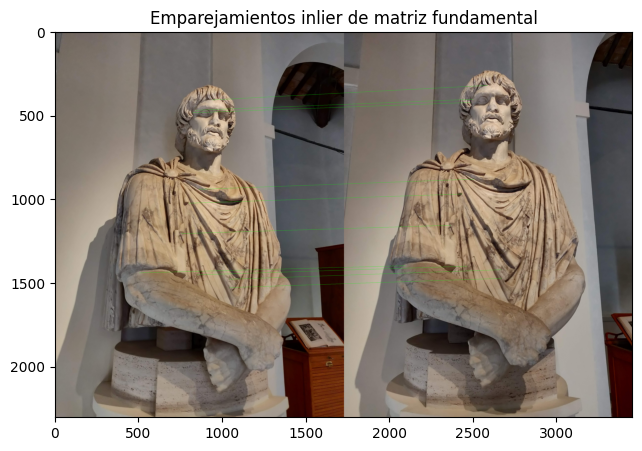

In [ ]:
# contendra tple (rotation, translation)
cameras = []
# contendra tuple (points3d, colors)
points3d = []

points3d_more = []

# Calcular Matriz fundamental
F, mask = cv2.findFundamentalMat(pts1, pts2, cv2.RANSAC, ransacReprojThreshold=0.1, confidence=99.99)
pts1_f = pts1[mask.ravel()==1]
pts2_f = pts2[mask.ravel()==1]
print(f"Inlier points 1: {pts1_f.shape}\nInlier points 2: {pts2_f.shape} ")
print(f"Fundamental matrix\n{F}")
print_fundamental_matches(img1, img2,pts1_f, pts2_f, mask )

### **Construir manualmente el mapa de dispariedad para comprobar si los puntos son buenos**

Image sizes: (2304, 1728, 3) and (2304, 1728, 3)


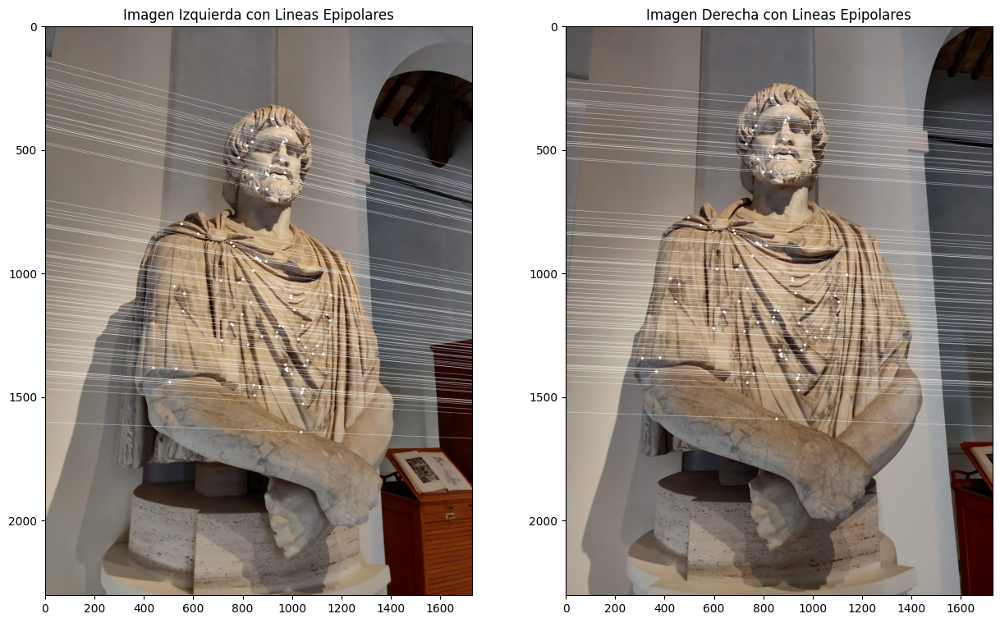

In [ ]:
show_epipolar(pts1_f, pts2_f, img1, img2, F)

Image sizes: (2304, 1728, 3) and (2304, 1728, 3)


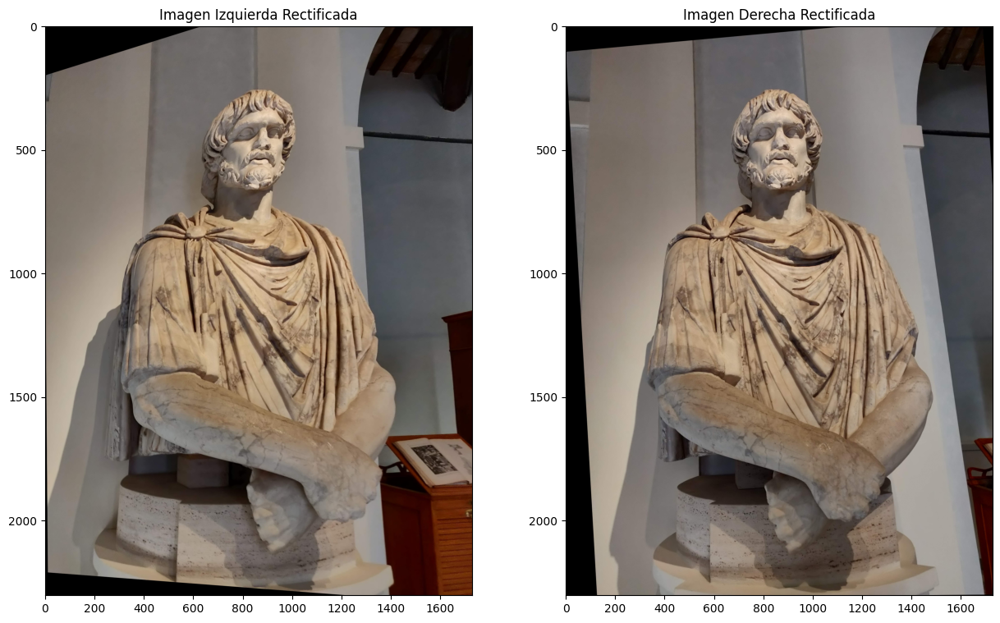

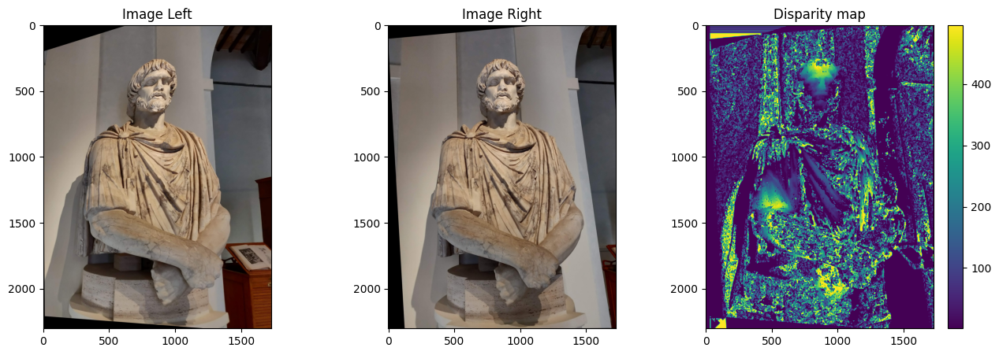

In [ ]:
show_disparity(pts1_f, pts2_f, img1, img2, F)

### **Obtener matriz escencial**

La matriz esencial 𝐸 encapsula la relación entre los puntos correspondientes en dos imágenes tomadas desde diferentes posiciones de cámara, teniendo en cuenta la calibración de las cámaras.
La matriz esencial se obtiene a partir de la matriz fundamental mediante la siguiente relación, que involucra las matrices de calibración intrínseca de las cámaras:

𝐸=𝐾′𝑇𝐹𝐾

A partir de la descomposición de la matriz fundamental se obtiene la matriz escencial, y a partir de esta se obtienen las matrices de proyección de las cámaras, la cámara 1 es la que se toma como referencia, de modo que lo que se obtiene es la posición de la camara 2 respecto a la cámara 1.

In [ ]:
# Matriz esencial
E = K.T.dot(F.dot(K))
U, S, V = np.linalg.svd(E)
S = [1, 1, 0]
E = np.dot(U, np.dot(np.diag(S), V))

print(f"Matriz escencial: \n {E}")
_,R,t,_ = cv2.recoverPose(E,pts1_f,pts2_f,K)
print(f"Matriz de rotación:\n {R}\nVector de traslacion \n{t} ")

#Matrices de proyeccion
R1, t1 = np.eye(3,3), np.zeros((3,1))
R2, t2 = R,t
cameras.append((R,t))

Matriz escencial: 
 [[-8.30837070e-03 -6.42309253e-02  5.98794448e-02]
 [ 3.16067380e-01 -4.79606240e-04 -9.46867437e-01]
 [-1.61893621e-01  9.83365973e-01 -5.04466826e-02]]
Matriz de rotación:
 [[ 0.96135156  0.11067017  0.25210174]
 [-0.10507863  0.99382726 -0.03557898]
 [-0.25448311  0.0077134   0.96704646]]
Vector de traslacion 
[[-0.99610231]
 [-0.05952511]
 [-0.06509186]] 


### **Ahora con más puntos, se hace la triangulación y se construye la nube de puntos**

Para obtener la metriz fundamental, aplicamos ransac con un umbral muy pequeño para obtener los mejores emparejamientos, ahora para obtener una nube de puntos esto no es tan importante, y podemos usar más puntos, el umbral de 100 pixeles es porque las imágenes ya de por si son bastante grandes

In [ ]:
pts1_r, pts2_r, desc1_r, desc2_r, _, _ , _ = find_best_matches(kp1, desc1, kp2, desc2, "", 0.80)
pts1_r, pts2_r, desc1_r, desc2_r, _  = ransac(pts1_r,desc1_r,  pts2_r, desc2_r, 100)
pts3d = get_3d_points(pts1_r, pts2_r, K, R1, t1, R2, t2)

colors = getColors(pts1_r, img1)
points3d.append((pts3d, colors))

Matched points 4351
Good matches 856
RANSAC matches: pts1 (740, 2) and pts2 (740, 2)


In [ ]:
plot_3d(pts3d, colors)

### **Bundle adjustemnt a la nube de puntos obtenida a partir de dos vistas**

Con el bundle adjustment obtenemos las posiciones de las cámaras más refinadas

In [ ]:
R1_, t1_, R2_, t2_, res = my_bundle_adjusment(pts3d, pts1_r, pts2_r, R1, t1, R2, t2)
pts3d_adjusted = get_3d_points(pts1_r, pts2_r, K, R1_, t1_, R2_, t2_)
colors = getColors(pts1_r, img1)

print("Refined Rotation 1:\n", R1_)
print("Refined Translation 1:\n", t1_)
print("Refined Rotation 2:\n", R2_)
print("Refined Translation 2:\n", t2_)

cameras = []
cameras.append((R2_, t2_))
points3d = []
points3d.append((pts3d_adjusted, colors))

Refined Rotation 1:
 [[ 0.99998717  0.00286712  0.00417632]
 [-0.00289152  0.99997873  0.00584668]
 [-0.00415947 -0.00585868  0.99997419]]
Refined Translation 1:
 [[-0.01786432]
 [-0.02411025]
 [ 0.02376988]]
Refined Rotation 2:
 [[ 0.96173811  0.10939539  0.25118212]
 [-0.10226279  0.99389903 -0.04131643]
 [-0.2541695   0.01404901  0.96705765]]
Refined Translation 2:
 [[-0.98844819]
 [-0.03473267]
 [-0.088999  ]]


In [ ]:
error, _ = reprojection_error(pts3d,pts2_r, K, R2, t2 )
print("Error antes del bundle adjustment ", error)
error, _ = reprojection_error(pts3d_adjusted,pts2_r, K, R2_, t2_ )
print("Error después del bundle adjustment ", error)


Error antes del bundle adjustment  0.24303398871640255
Error después del bundle adjustment  0.11675846665808536


In [ ]:
plot_3d(pts3d_adjusted, colors)

### **Agregamos el resto de las imágenes**

Para incluir más imagenes y enriquecer la nube de puntos que obtuvimos con dos vistas debemos encontrar la posición de la tercera camara respecto a la nube de puntos que ya tenemos, para eso se utiliza el algoritmo PnP (Perspective-n-Point)

Para lograr esto:

1. Calculamos keypoints de la siguientes vista a incluir
2. Se obtienen los emparejamientos con los puntos de la vista anterior usados para obtener la nube de puntos
3. Se sacan los puntos de la nube de puntos obtenidos con los puntos emparejados
4. Se aplica el algoritmo PnP con ayuda de opencv, obteniendo las matriz de proyección de la nueva vista con respecto a la nube de puntos
5. Se obtiene la nube de puntos con más puntos
6. Se concatena la nube de puntos obtenida con la nube de puntos que ya se tenía

In [ ]:
prev_img = img2
kp_prev = kp2
desc_prev = desc2

# Lo que diga _r es porque se usó para la triangulacion
kp_prev_r = tuple(cv2.KeyPoint(x=pt[0], y=pt[1], size=1) for pt in pts2_r) # convert points to kp
desc_prev_r = desc2_r

pts3d_prev = pts3d_adjusted

pts3d_all = pts3d_adjusted
colors_all = colors

R = R2_
t = t2_

Descriptors vista anterior:  740
Keypoints vista anteriror:  740
Puntos vista anterior (740, 3)
Matched points 740
Good matches 317
Object points (317, 3)
Image points (317, 2)
Success: True
Rotation:
[[ 0.00546524]
 [ 0.48809827]
 [-0.19060936]]
Translation:
[[-1.76513535]
 [ 0.05157401]
 [ 0.14769475]]
Matched points 5167
Good matches 1246
RANSAC matches: pts1 (1088, 2) and pts2 (1088, 2)


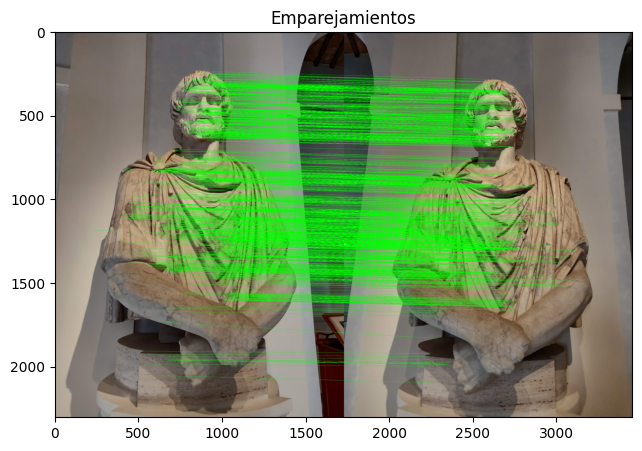

Reprojection error  0.08131381806551227
Descriptors vista anterior:  1088
Keypoints vista anteriror:  1088
Puntos vista anterior (1088, 3)
Matched points 1088
Good matches 463
Object points (463, 3)
Image points (463, 2)
Success: True
Rotation:
[[ 0.0366274 ]
 [ 0.61995315]
 [-0.23873506]]
Translation:
[[-2.45216519]
 [ 0.13328759]
 [ 0.27576482]]
Matched points 5341
Good matches 1388
RANSAC matches: pts1 (1159, 2) and pts2 (1159, 2)


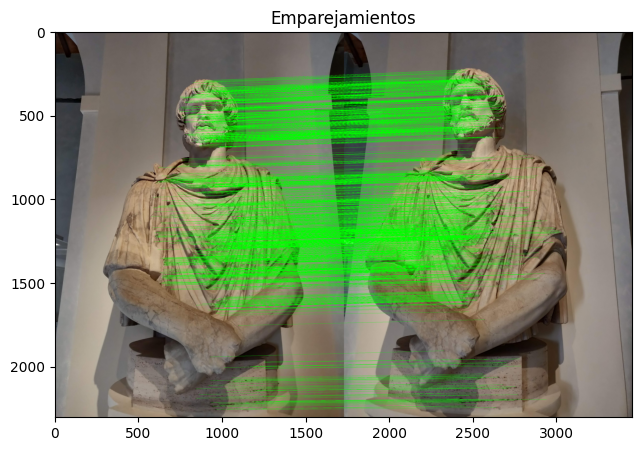

Reprojection error  0.06618470052974118
Descriptors vista anterior:  1159
Keypoints vista anteriror:  1159
Puntos vista anterior (1159, 3)
Matched points 1159
Good matches 507
Object points (507, 3)
Image points (507, 2)
Success: True
Rotation:
[[ 0.06995091]
 [ 0.45211437]
 [-0.15297609]]
Translation:
[[-1.64503126]
 [ 0.08142673]
 [ 0.096985  ]]
Matched points 5226
Good matches 1127
RANSAC matches: pts1 (997, 2) and pts2 (997, 2)


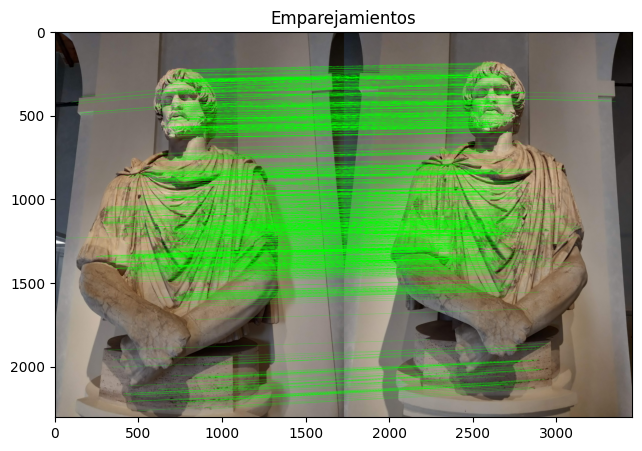

Reprojection error  0.049639556934087135
Descriptors vista anterior:  997
Keypoints vista anteriror:  997
Puntos vista anterior (997, 3)
Matched points 997
Good matches 509
Object points (509, 3)
Image points (509, 2)
Success: True
Rotation:
[[ 0.24575775]
 [ 0.42264452]
 [-0.04551223]]
Translation:
[[-1.57878803]
 [ 0.76926255]
 [-0.12673306]]
Matched points 5147
Good matches 1681
RANSAC matches: pts1 (1552, 2) and pts2 (1552, 2)


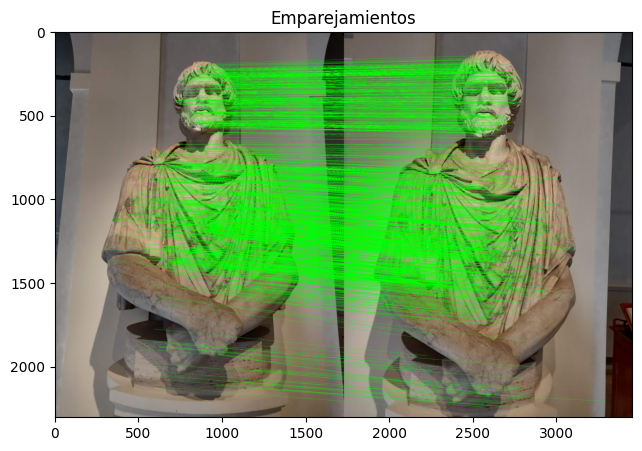

Reprojection error  0.03999962459917716


In [ ]:
for i in range(2, len(images_ud)):
    img = images_ud[i]
    kp, desc = keypoints[i]

    print("Descriptors vista anterior: ",len(desc_prev_r))
    print("Keypoints vista anteriror: ",len(kp_prev_r))
    print("Puntos vista anterior", pts3d_prev.shape)

    # matching with those keypoints

    pts1_r, pts2_r, desc1_r, desc2_r, _, img1idx, img2idx = find_best_matches(kp_prev_r, desc_prev_r, kp, desc, "", 0.70)


    # Filter keypoints based on good matches indices
    # the ones in the last 3d are the same as the kp used in the triangulation of that view!
    # (lo estoy haciendo asi porque no entendi como lo hacen en los notebooks, pero me funciona :c)
    objectPoints = pts3d_prev[img1idx]
    kp_ = np.array(kp)[img2idx]
    imagePoints = np.array([kp.pt for kp in kp_])

    print(f"Object points {objectPoints.shape}\nImage points {imagePoints.shape}")

    success, rvec, tvec, _ = cv2.solvePnPRansac(objectPoints,imagePoints,K,dist,
                        confidence=0.99, flags=cv2.SOLVEPNP_ITERATIVE,reprojectionError=3.0)
    print(f"Success: {success}\nRotation:\n{rvec}\nTranslation:\n{tvec}")

    # Convertir el vector de rotacion en una matriz de rotacion
    R_new, _ = cv2.Rodrigues(rvec)
    T_new = tvec

    # Obtener nube de puntos con mas puntos
    kp_prev_r, kp_curr_r, desc_prev_r, desc_curr_r, _, _ , _ = find_best_matches(kp_prev,desc_prev,kp,desc, "", 0.80)
    kp_prev_r, kp_curr_r, desc_prev_r, desc_curr_r, _ = ransac( kp_prev_r, desc_prev_r,kp_curr_r,desc_curr_r, 100 )
    print_best_matches(prev_img, img, kp_prev_r, kp_curr_r)

    pts3d_new = get_3d_points(kp_prev_r, kp_curr_r, K, R, t, R_new, T_new)
    colors_new = getColors(kp_curr_r, img)

    # Bundle adjustment
    R_, t_, R_new_, t_new_, _ = my_bundle_adjusment(pts3d_new, kp_prev_r, kp_curr_r, R, t, R_new, T_new)
    pts3d_new_adjusted = get_3d_points(kp_prev_r, kp_curr_r, K, R_, t_, R_new_, t_new_)

    error, _ = reprojection_error(pts3d_new_adjusted,kp_curr_r, K, R_new_, t_new_ )
    print("Reprojection error ", error)

    points3d.append((pts3d_new_adjusted, colors_new))

    pts3d_all = np.concatenate((pts3d_all, pts3d_new_adjusted))
    colors_all = np.concatenate((colors_all, colors_new))
    cameras.append((R_new_, t_new_))

    # Reseteando variables
    prev_img = img
    kp_prev = kp
    desc_prev = desc
    kp_prev_r = tuple(cv2.KeyPoint(x=pt[0], y=pt[1], size=1) for pt in kp_curr_r) # convert points to kp
    desc_prev_r = desc_curr_r
    pts3d_prev = pts3d_new_adjusted
    R = R_new_
    t = t_new_

In [27]:
def remove_outliers(points, color, scale=1.0, threshold=3.0):
    # Scale the points

    # Convert points to Open3D point cloud
    pcd = o3d.geometry.PointCloud()
    pcd.points = o3d.utility.Vector3dVector(points)
    pcd.colors = o3d.utility.Vector3dVector(np.array(color))

    # Calculate mean and standard deviation along each axis
    mean = np.mean(points, axis=0)
    std_dev = np.std(points, axis=0)

    # Define lower and upper bounds based on the threshold
    lower_bound = mean - threshold * std_dev
    upper_bound = mean + threshold * std_dev

    # Remove outliers
    mask = np.all((lower_bound <= points) & (points <= upper_bound), axis=1)
    filtered_points = points[mask]

    scaled_points = np.array(points) * scale
    filtered_colors = np.array(color)[mask]

    return filtered_points, filtered_colors

In [ ]:
p, c = remove_outliers(pts3d_all, colors_all, threshold = 8)
plot_3d(pts3d_all, colors_all)
plot_3d(p, c)
print(pts3d_all.shape)

(5536, 3)


In [ ]:
def save_pointcloud_to_ply(points, colors, filename):
    # Create a point cloud object
    pcd = o3d.geometry.PointCloud()

    # Assign points and colors
    pcd.points = o3d.utility.Vector3dVector(points)
    pcd.colors = o3d.utility.Vector3dVector(colors)

    # Write the point cloud to a .ply file
    o3d.io.write_point_cloud(filename, pcd)
    print(f"Point cloud saved to {filename}")

In [ ]:
save_pointcloud_to_ply(pts3d_all, colors_all, folder + "/results/pointcloud_greek.ply")

Point cloud saved to /content/drive/MyDrive/computer vision/results/pointcloud_greek.ply


La visualización con o3d no funciona en notebooks :c pero se ve muy chevere

In [ ]:
point_cloud = o3d.io.read_point_cloud(folder + "/results/pointcloud_greek.ply")

plot_3d(pts3d_all, colors_all)

# Convert to numpy array
points = np.asarray(pcd.points)

# Create Plotly figure
fig = go.Figure(data=[go.Scatter3d(
    x=points[:, 0],
    y=points[:, 1],
    z=points[:, 2],
    mode='markers'
)])

# Show the figure
fig.show()

NameError: name 'o3d' is not defined

In [ ]:
for p, c in  points3d:
    plot_3d(p,c)

### Dilatar y erosión de puntos: juntar puntos cercanos

In [ ]:
# to do :)

# Probar con otras imágenes!

In [13]:
# Specify the directory containing the images
# tenemos estatua, geometria

folder = "/content/drive/MyDrive/computer vision"
image_folder = folder + "/luisA"


In [14]:

# List all files in the directory
image_files = sorted([f for f in os.listdir(image_folder) if os.path.isfile(os.path.join(image_folder, f))])

# Initialize an empty list to store the images
images = []
images_gray = []

# Load each image and store it in the list
for file_name in image_files:
    img_path = os.path.join(image_folder, file_name)
    img = cv2.imread(img_path)
    if img is not None:  # Check if the image was loaded successfully
        # algunas imagenes hay que rotarlas
        rotated_img = cv2.rotate(img, cv2.ROTATE_90_COUNTERCLOCKWISE)
        rotated_img = img
        images_gray.append(cv2.cvtColor(rotated_img, cv2.COLOR_BGR2GRAY))
        images.append(cv2.cvtColor(rotated_img, cv2.COLOR_BGR2RGB))
    else:
        print(f"Warning: Could not load image {img_path}")

# Determine the number of images
num_images = len(images)
print(f"Loaded {num_images} images.")

Loaded 27 images.


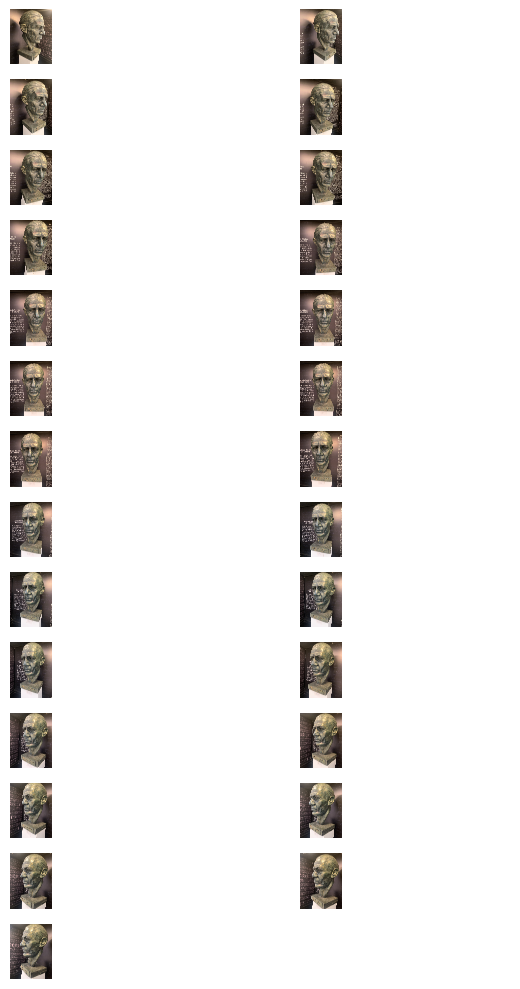

In [15]:
# Determine the grid size for plotting
cols = 2  # Number of columns in the grid
rows = (num_images + cols - 1) // cols  # Calculate the number of rows needed

# Create a figure to display the images
fig, axes = plt.subplots(rows, cols, figsize=(7, 10))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Plot each image
for ax, img in zip(axes, images):
    # Convert the image from BGR to RGB format
    ax.imshow(img)
    ax.axis('off')  # Hide the axis

# Hide any remaining empty subplots
for ax in axes[num_images:]:
    ax.axis('off')

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

In [16]:
images[0].shape

(4032, 3024, 3)

In [44]:
# depende de las imagenes seleccionadas
# ramiro
K =  np.array([[3079.0, 0.0000, 1505.9],[0.0000, 3065.7, 1982.1],[0.0000 ,0.0000 ,1.0000]])
dist = np.array([0.0, 0.0, 0.0, 0.0 ])

In [45]:
# si  quiero  bajarle el tamaño a las imagenes
print(f"Tamaño original {images[0].shape}")
scale_factor = 2 # factor de escala
images_resized = []
for i in images:
    img = i
    #img = undistort_image(i, K, dist)
    images_resized.append(resize_image(img, scale_factor))

# resizing K
K[0,0] /= scale_factor
K[1,1] /= scale_factor
K[0,2] /= scale_factor
K[1,2] /= scale_factor

# voy a quitarle la distorsion
#dist = np.array([0.0,0.0,0.0,0.0])

Tamaño original (4032, 3024, 3)
New shape:  (2016, 1512, 3)
New shape:  (2016, 1512, 3)
New shape:  (2016, 1512, 3)
New shape:  (2016, 1512, 3)
New shape:  (2016, 1512, 3)
New shape:  (2016, 1512, 3)
New shape:  (2016, 1512, 3)
New shape:  (2016, 1512, 3)
New shape:  (2016, 1512, 3)
New shape:  (2016, 1512, 3)
New shape:  (2016, 1512, 3)
New shape:  (2016, 1512, 3)
New shape:  (2016, 1512, 3)
New shape:  (2016, 1512, 3)
New shape:  (2016, 1512, 3)
New shape:  (2016, 1512, 3)
New shape:  (2016, 1512, 3)
New shape:  (2016, 1512, 3)
New shape:  (2016, 1512, 3)
New shape:  (2016, 1512, 3)
New shape:  (2016, 1512, 3)
New shape:  (2016, 1512, 3)
New shape:  (2016, 1512, 3)
New shape:  (2016, 1512, 3)
New shape:  (2016, 1512, 3)
New shape:  (2016, 1512, 3)
New shape:  (2016, 1512, 3)


In [31]:
border = 0 # modificar esto si se quieren omitir los bordes de la imagen
keypoints = []
images_ud = []
for i in images_resized:
    img = i
    # feature extraction
    roi = (border, border, img.shape[1] - 2*border, img.shape[0] - 2*border)
    kp, desc = get_keypoints(img,roi)
    images_ud.append(img)
    keypoints.append((kp, desc))

Keypoints with SIFT: 22344
Keypoints with SIFT: 19164
Keypoints with SIFT: 19275
Keypoints with SIFT: 20625
Keypoints with SIFT: 21683
Keypoints with SIFT: 20530
Keypoints with SIFT: 19501
Keypoints with SIFT: 18375
Keypoints with SIFT: 17113
Keypoints with SIFT: 15427
Keypoints with SIFT: 17134
Keypoints with SIFT: 16498
Keypoints with SIFT: 16034
Keypoints with SIFT: 16357
Keypoints with SIFT: 15257
Keypoints with SIFT: 12550
Keypoints with SIFT: 12732
Keypoints with SIFT: 13389
Keypoints with SIFT: 15950
Keypoints with SIFT: 18246
Keypoints with SIFT: 24578
Keypoints with SIFT: 26118
Keypoints with SIFT: 27556
Keypoints with SIFT: 26041
Keypoints with SIFT: 27986
Keypoints with SIFT: 29561
Keypoints with SIFT: 28112


In [48]:
img1 = images_ud[0]
img2 = images_ud[1]

kp1, desc1 = keypoints[0]
kp2, desc2 = keypoints[1]
kp1_r, kp2_r, desc1_r, desc2_r, good_matches, _, _ = find_best_matches(kp1, desc1, kp2, desc2, "", 0.70)

pts1 = np.float32(kp1_r)
pts2 = np.float32(kp2_r)

Matched points 22344
Good matches 3800


Inlier points 1: (577, 2)
Inlier points 2: (577, 2) 
Fundamental matrix
[[ 1.71297691e-07  9.65998898e-07 -2.39431807e-03]
 [-1.40095526e-07 -8.61973247e-08 -5.94944738e-03]
 [ 1.23819599e-03  5.35309451e-03  1.00000000e+00]]


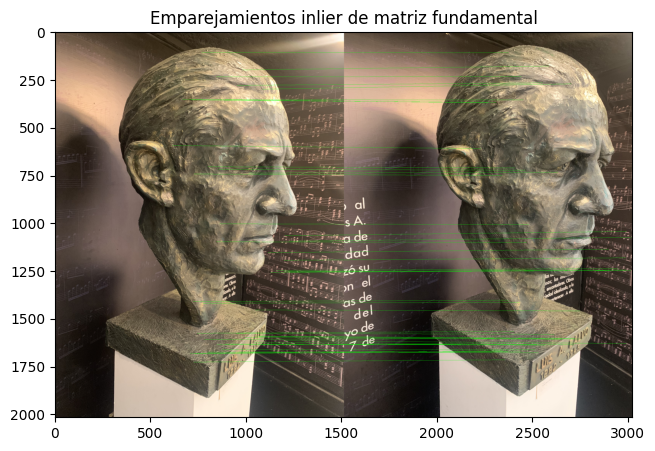

In [49]:
# contendra tple (rotation, translation)
cameras = []
# contendra tuple (points3d, colors)
points3d = []

points3d_more = []

# Calcular Matriz fundamental
F, mask = cv2.findFundamentalMat(pts1, pts2, cv2.RANSAC, ransacReprojThreshold=0.1, confidence=99.99)
pts1_f = pts1[mask.ravel()==1]
pts2_f = pts2[mask.ravel()==1]
print(f"Inlier points 1: {pts1_f.shape}\nInlier points 2: {pts2_f.shape} ")
print(f"Fundamental matrix\n{F}")
print_fundamental_matches(img1, img2,pts1_f, pts2_f, mask )

In [50]:
# Matriz esencial
E = K.T.dot(F.dot(K))
U, S, V = np.linalg.svd(E)
S = [1, 1, 0]
E = np.dot(U, np.dot(np.diag(S), V))

print(f"Matriz escencial: \n {E}")
_,R,t,_ = cv2.recoverPose(E,pts1_f,pts2_f,K)
print(f"Matriz de rotación:\n {R}\nVector de traslacion \n{t} ")

#Matrices de proyeccion
R1, t1 = np.eye(3,3), np.zeros((3,1))
R2, t2 = R,t
cameras.append((R,t))

Matriz escencial: 
 [[ 0.04186272  0.23515772 -0.20831011]
 [-0.03494058 -0.02400556 -0.97738574]
 [ 0.19572516  0.95065609  0.02049229]]
Matriz de rotación:
 [[ 0.9775947   0.0121234   0.2101467 ]
 [-0.0071744   0.99967905 -0.02429663]
 [-0.21037381  0.02224458  0.97736791]]
Vector de traslacion 
[[-0.94844887]
 [ 0.20717145]
 [ 0.23984314]] 


In [51]:
img1 = images_ud[0]
img2 = images_ud[1]

kp1, desc1 = keypoints[0]
kp2, desc2 = keypoints[1]

pts1_r, pts2_r, desc1_r, desc2_r, _, _ , _ = find_best_matches(kp1, desc1, kp2, desc2, "", 0.80)
pts1_r, pts2_r, desc1_r, desc2_r, _  = ransac(pts1_r,desc1_r,  pts2_r, desc2_r, 10)
pts3d = get_3d_points(pts1_r, pts2_r, K, R1, t1, R2, t2)

colors = getColors(pts1_r, img1)
points3d.append((pts3d, colors))

Matched points 22344
Good matches 5299
RANSAC matches: pts1 (2281, 2) and pts2 (2281, 2)


In [52]:
R1_, t1_, R2_, t2_, res = my_bundle_adjusment(pts3d, pts1_r, pts2_r, R1, t1, R2, t2)
pts3d_adjusted = get_3d_points(pts1_r, pts2_r, K, R1_, t1_, R2_, t2_)
colors = getColors(pts1_r, img1)

print("Refined Rotation 1:\n", R1_)
print("Refined Translation 1:\n", t1_)
print("Refined Rotation 2:\n", R2_)
print("Refined Translation 2:\n", t2_)

cameras = []
cameras.append((R2_, t2_))
points3d = []
points3d.append((pts3d_adjusted, colors))

# comenzando el ciclo
prev_img = img2
kp_prev = kp2
desc_prev = desc2

# Lo que diga _r es porque se usó para la triangulacion
kp_prev_r = tuple(cv2.KeyPoint(x=pt[0], y=pt[1], size=1) for pt in pts2_r) # convert points to kp
desc_prev_r = desc2_r

pts3d_prev = pts3d_adjusted

pts3d_all = pts3d_adjusted
colors_all = colors

R = R2_
t = t2_

Refined Rotation 1:
 [[ 9.99997522e-01  4.05601307e-04 -2.18893778e-03]
 [-4.07960084e-04  9.99999337e-01 -1.07725113e-03]
 [ 2.18849939e-03  1.07814146e-03  9.99997024e-01]]
Refined Translation 1:
 [[0.01794999]
 [0.01862473]
 [0.00651325]]
Refined Rotation 2:
 [[ 0.97704745  0.01177698  0.212696  ]
 [-0.0069045   0.99969678 -0.02363646]
 [-0.21290987  0.02162539  0.9768325 ]]
Refined Translation 2:
 [[-0.96994742]
 [ 0.19184487]
 [ 0.2363875 ]]


In [53]:
for i in range(2, len(images_ud)):
    img = images_ud[i]
    kp, desc = keypoints[i]

    print("Descriptors vista anterior: ",len(desc_prev_r))
    print("Keypoints vista anteriror: ",len(kp_prev_r))
    print("Puntos vista anterior", pts3d_prev.shape)

    # matching with those keypoints

    pts1_r, pts2_r, desc1_r, desc2_r, _, img1idx, img2idx = find_best_matches(kp_prev_r, desc_prev_r, kp, desc, "", 0.70)


    # Filter keypoints based on good matches indices
    # the ones in the last 3d are the same as the kp used in the triangulation of that view!
    # (lo estoy haciendo asi porque no entendi como lo hacen en los notebooks, pero me funciona :c)
    objectPoints = pts3d_prev[img1idx]
    kp_ = np.array(kp)[img2idx]
    imagePoints = np.array([kp.pt for kp in kp_])

    print(f"Object points {objectPoints.shape}\nImage points {imagePoints.shape}")

    success, rvec, tvec, _ = cv2.solvePnPRansac(objectPoints,imagePoints,K,dist,
                        confidence=0.99, flags=cv2.SOLVEPNP_ITERATIVE,reprojectionError=3.0)
    print(f"Success: {success}\nRotation:\n{rvec}\nTranslation:\n{tvec}")

    # Convertir el vector de rotacion en una matriz de rotacion
    R_new, _ = cv2.Rodrigues(rvec)
    T_new = tvec

    # Obtener nube de puntos con mas puntos
    kp_prev_r, kp_curr_r, desc_prev_r, desc_curr_r, _, _ , _ = find_best_matches(kp_prev,desc_prev,kp,desc, "", 0.80)
    kp_prev_r, kp_curr_r, desc_prev_r, desc_curr_r, _ = ransac( kp_prev_r, desc_prev_r,kp_curr_r,desc_curr_r, 10 )
    print_best_matches(prev_img, img, kp_prev_r, kp_curr_r)

    pts3d_new = get_3d_points(kp_prev_r, kp_curr_r, K, R, t, R_new, T_new)
    colors_new = getColors(kp_curr_r, img)

    # Bundle adjustment
    R_, t_, R_new_, t_new_, _ = my_bundle_adjusment(pts3d_new, kp_prev_r, kp_curr_r, R, t, R_new, T_new)
    pts3d_new_adjusted = get_3d_points(kp_prev_r, kp_curr_r, K, R_, t_, R_new_, t_new_)

    error, _ = reprojection_error(pts3d_new_adjusted,kp_curr_r, K, R_new_, t_new_ )
    print("Reprojection error ", error)

    points3d.append((pts3d_new_adjusted, colors_new))

    pts3d_all = np.concatenate((pts3d_all, pts3d_new_adjusted))
    colors_all = np.concatenate((colors_all, colors_new))
    cameras.append((R_new_, t_new_))

    # Reseteando variables
    prev_img = img
    kp_prev = kp
    desc_prev = desc
    kp_prev_r = tuple(cv2.KeyPoint(x=pt[0], y=pt[1], size=1) for pt in kp_curr_r) # convert points to kp
    desc_prev_r = desc_curr_r
    pts3d_prev = pts3d_new_adjusted
    R = R_new_
    t = t_new_

Output hidden; open in https://colab.research.google.com to view.

In [55]:
p, c = remove_outliers(pts3d_all, colors_all, threshold = 4)
#plot_3d(pts3d_all, colors_all)
plot_3d(p, c)
print(pts3d_all.shape)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
save_pointcloud_to_ply(pts3d_all, colors_all, folder + "/results/geometria.ply")

Point cloud saved to /content/drive/MyDrive/computer vision/results/geometria.ply


# Ver nubes de puntos ya listas

In [ ]:
point_cloud = o3d.io.read_point_cloud(folder + "/results/pointcloud_greek.ply")
plot_3d(point_cloud.points, point_cloud.colors)

![Estatua Luis A Calvo](https://i.imgur.com/TSw8yLJ.gif)

In [56]:
point_cloud = o3d.io.read_point_cloud(folder + "/results/pointcloud_luisa.ply")
plot_3d(point_cloud.points, point_cloud.colors)

Output hidden; open in https://colab.research.google.com to view.

In [57]:
point_cloud = o3d.io.read_point_cloud(folder + "/results/pointcloud_geometria.ply")
plot_3d(point_cloud.points, point_cloud.colors)

![Estatua humanas](https://i.imgur.com/VwrNeSF.gif)

In [63]:
point_cloud = o3d.io.read_point_cloud(folder + "/results/pointcloud_estatua_listo.ply")
plot_3d(point_cloud.points, point_cloud.colors)

Output hidden; open in https://colab.research.google.com to view.

In [64]:
point_cloud = o3d.io.read_point_cloud(folder + "/results/pointcloud_fuente.ply")
plot_3d(point_cloud.points, point_cloud.colors)